# Computer Vision

Image analysis and computer vision have always been important in industrial and scientific applications. Therefore, there are opportunities to make use of computer vision to provide a better user experience in new contexts.

In this noebook, it will be discussed how to apply several techniques that have been learned about in the rest of this repository to this specific type of data. In particular, it will be discussed how to use the mahotas computer vision package to extract features from images. It will be also seen how the same features can be used for finding similar images. It will be discussed about using local features. These are relatively generic and achieve very good results in many tasks (although they have a higher computational cost).

Finally, at the end of the chapter, Tensorflow will be used to generate new images based on an existing dataset. In particular, in this chapter the following will be done:
* Learn how to represent and manipulate images as NumPy arrays
* Learn how to represent images as a small set of features so that standard classification and clustering methods can be used on this data type
* Learn how to use visual words to generate another type of feature
* Learn how to generate new images similar to existing ones

## Introducing image processing

From the point of view of the computer, an image is a large rectangular array of pixel values. The goal is to process one or more image and to arrive at a decision for the application.

Depending on the setting, it may be a classification problem, a clustering problem, or any of the other problem classes we have seen in the repository.

The first step will be to load the image from disk, where it is typically stored in an image-specific format such as PNG or JPEG, the former being a lossless compression format and the latter a lossy compression, one that is optimized for visual assessment of photographs. Then, perform preprocessing on the images (for example, normalizing them for illumination variations).

### Loading and displaying images

In order to manipulate images, we will use a package called OpenCV. There are other image packages, such as scikit-image (skimage), the n-dimensional image (ndimage) module in SciPy, and mahotas. All of these work natively with NumPy arrays, so they can even mix and match functionality from different packages to build a combined pipeline.

Start by importing OpenCV with the cv abbreviation, which it will be used throughout this notebook, as follows:

In [1]:
import cv2 as cv

Now, an image file can be loaded using imread as follows:

In [2]:
image = cv.imread('scene00.jpg')
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)

The scene00.jpg file is a color image of height h and width w; the image will be an array of shape (h, w, 3). These are the images that the camera takes and that the monitor can fully display.

Some specialized equipment, used in scientific and technical applications, can take images with a higher bit resolution (that is, with more sensitivity to small variations in brightness). In many computations, even if the original data is composed of unsigned integers, it is advantageous to convert to floating point numbers in order to simplify the handling of rounding and overflow issues.

OpenCV can use a variety of different input/output backends. Unfortunately, none of them can load all image formats that exist (there are hundreds, with several variations of each). However, the loading of PNG and JPEG images is supported by all of them. Just focus on these common formats and refer to the OpenCV documentation on how to read uncommon formats.

The image can be displayed on screen using matplotlib, and the plotting library which has been already used several times, as follows:

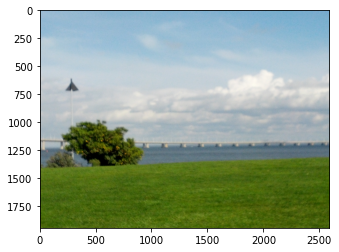

In [3]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots()
ax.imshow(image)
plt.show()

As shown in the above screenshot, this code shows the image using the convention that the first dimension is the height and the second the width. Later, features from images will  be computed to use with scikit-learn:

### Thresholding

Start this notebook with some simple image processing manipulations. This will later be useful when new features are introduced.

Thresholding is a very simple operation: it transforms all pixel values above a certain threshold to 1 and all those below it to 0 (or by using Booleans, transform them to True and False). The first necessary step is to convert the image to grayscale, with COLOR_RGB2GRAY as parameter in the cv.cvtColor function.

Instead of COLOR_RGB2GRAY, we could also have just the mean value of the red, green, and blue channels, by calling cv.mean(2).

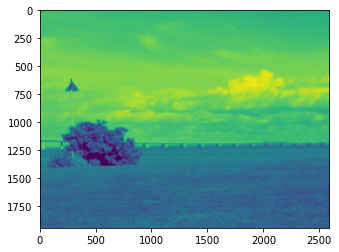

In [4]:
image = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
fig, ax = plt.subplots()
ax.imshow(image) # Display the image
plt.show()

By default, matplotlib will display this single-channel image as a false color image, using red for high values and blue for low values. For natural images, grayscale is more appropriate. It can be selected with:

<Figure size 432x288 with 0 Axes>

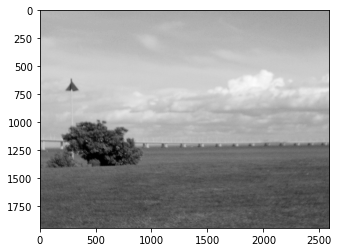

In [5]:
plt.gray()
fig, ax = plt.subplots()
ax.imshow(image) # Display the image
plt.show()

Now the image is shown in grayscale. Continue the processing by computing the threshold value. Thresholding is a form of two-class clustering and there are several methods for this task. Otsu is one such thresholding method, which attempts to find two compact groups of pixels, those above and those below the threshold:

Otsu threshold is 138.0.


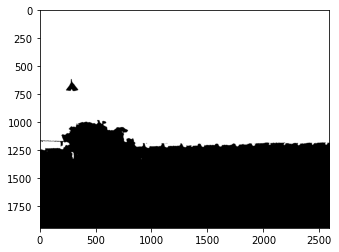

In [6]:
ret, thresh = cv.threshold(image, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
print('Otsu threshold is {}.'.format(ret))
fig, ax = plt.subplots()
ax.imshow(image < thresh)
plt.show()

When applied to the previous image, this method finds the threshold to be 138, which separates the ground from the sky above, as shown in the above screenshot:

### Gaussian blurring

Blurring the image may seem odd, but it often serves to reduce noise, which helps with further processing. With OpenCV, it is just a function call:

In [7]:
im16 = cv.GaussianBlur(image, (0, 0), 16, 16)

Notice that the grayscale image is not converted to unsigned integers; just made use of the floating point result as is. The second argument to the GaussianBlur function is the Gaussian kernel size and the third and the forth argument are Gaussian kernel standard deviation in X and Y direction. Larger values result in more blurring, as shown in the following screenshot:

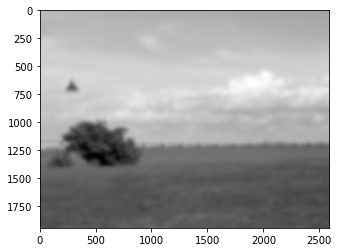

In [8]:
fig, ax = plt.subplots()
ax.imshow(im16)
plt.show()

The preceding screenshot and the threshold can be used with Otsu (using the previous code). Now, the boundaries are smoother, without the jagged edges, as shown in the following screenshot:

Otsu threshold is 138.0.


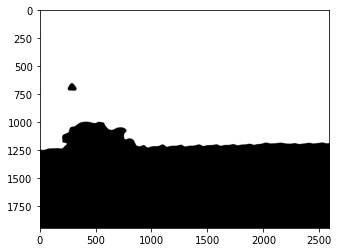

In [9]:
ret, thresh = cv.threshold(im16, 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
print('Otsu threshold is {}.'.format(ret))
fig, ax = plt.subplots()
ax.imshow(im16 < thresh)
plt.show()

### Putting the center in focus

The final example shows how to mix NumPy operators with a tiny bit of filtering to get an interesting result. Start with a photo of a path in the forest:

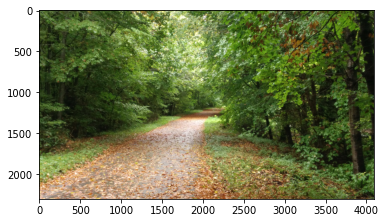

In [10]:
im = cv.imread('forest.jpeg')
im = cv.cvtColor(im, cv.COLOR_BGR2RGB)
fig, ax = plt.subplots()
ax.imshow(im)
plt.show()

To split the red, green, and blue channels, the following code is used. The NumPy transpose method changes the order of axes in a multi-dimensional array:

In [11]:
r, g, b = cv.split(im)

Now, the three channels are filtered separately and a composite image is built out of it with cv.merge. This function takes three two-dimensional arrays, performs contrast stretching to make each an 8-bit integer array, and then stacks them, returning a color RGB image:

In [12]:
r24 = cv.GaussianBlur(r, (0, 0), 24, 24)
g24 = cv.GaussianBlur(g, (0, 0), 24, 24)
b24 = cv.GaussianBlur(b, (0, 0), 24, 24)
im24 = cv.merge([r24, g24, b24])

Now, the two images are blended from the center away to the edges. First, aweights array W needs to be built, which will contain at each pixel a normalized value, which is its distance to the center:

In [13]:
import numpy as np

h, w = r.shape # height and width
Y, X = np.mgrid[:h, :w]

The np.mgrid object was used, which returns arrays of size (h, w), with values corresponding to the y and x coordinates, respectively. The next steps are as follows:

In [14]:
Y = Y - h/2. # center at h/2
Y = Y / Y.max() # normalize to -1 .. +1
X = X - w/2.
X = X / X.max()

A Gaussian function is now useb to give the center region a high value:

In [15]:
C = np.exp(-2.*(X**2+ Y**2))
# Normalize again to 0..1
C = C - C.min()
C = C / C.ptp()
C = C[:, :, None] # This adds a dummy third dimension to C

Notice that all of these manipulations are performed using NumPy arrays and not some OpenCV-specific methodology:

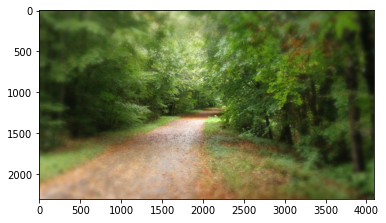

In [16]:
ringed = (im*C + (1-C)*im24).astype(np.uint8)
fig, ax = plt.subplots()
ax.imshow(ringed)
plt.show()

## Basic image classification

Start with a small dataset that was collected especially for this repository. It has three classes: buildings, natural scenes (landscapes), and pictures of text. There are 30 images in each category, and they were all taken using a cell phone camera with minimal composition. Later in this notebook, look at a larger dataset with more images and more categories that are more difficult to classify.

When classifying images, start with a large rectangular array of numbers (pixel values). Nowadays, millions of pixels are common. Try to feed all these numbers as features into the learning algorithm. This is not a very good idea unless there is a lot of data. Instead, a good approach for smaller problems is to compute features from the image and use those features for classification.

An example of the scene class was previously used. The following are examples of the text and building classes:

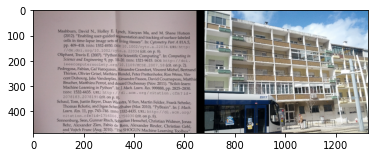

In [17]:
text = cv.imread("./SimpleImageDataset/text21.jpg")
text = cv.cvtColor(text, cv.COLOR_BGR2RGB)
building = cv.imread("./SimpleImageDataset/building00.jpg")
building = cv.cvtColor(building, cv.COLOR_BGR2RGB)
h, w, _ = text.shape
canvas = np.zeros((h, 2 * w + 128, 3), np.uint8)
canvas[:, -w:] = building
canvas[:, :w] = text
canvas = canvas[::4, ::4]
fig, ax = plt.subplots()
ax.imshow(canvas)
plt.show()

## Computing features from images

With mahotas, it is very easy to compute features from images. There is a submodule named mahotas.features, where feature computation functions are available.

A commonly used set of texture features is the Haralick set. These features are texture-based; they distinguish between images that are smooth and those that are patterned, and between different patterns. With mahotas, it is very easy to compute them as follows:

haralick_features = mh.features.haralick(image)

haralick_features_mean = np.mean(haralick_features, axis=0)

haralick_features_all = np.ravel(haralick_features)

The mh.features.haralick function returns a 4 x 13 array. The first dimension refers to four possible directions in which to compute the features (vertical, horizontal, diagonal, and anti-diagonal). If not interested in the direction specifically, the average over all the directions can be used (shown in the earlier code as haralick_features_mean). Otherwise, all the features can be used separately (using haralick_features_all). In this case, it is reasoned that the horizontal and vertical directions should be kept separately. Therefore, haralick_features_all will be used.

There are a few other feature sets implemented in mahotas. Linear binary patterns are another texture-based feature set, which is very robust against illumination changes. There are other types of features, including local features, which it will be discussed later in this notebook.

With these features, a standard classification method such as logistic regression is used, as follows:

In [18]:
from glob import glob
import mahotas as mh

images = glob('SimpleImageDataset/*.jpg')
features = []
labels = []
for im in images:
    labels.append(im[:-len('00.jpg')])
    im = mh.imread(im)
    im = mh.colors.rgb2gray(im, dtype=np.uint8)
    features.append(mh.features.haralick(im).ravel())
features = np.array(features)
labels = np.array(labels)

The three classes have very different textures. Buildings have sharp edges and big blocks where the color is similar (the pixel values are rarely exactly the same, but the variation is slight). Text is made of many sharp dark-light transitions, with small black areas in a sea of white. Natural scenes have smoother variations with fractal-like transitions. Therefore, a classifier based on texture is expected to do well.

Use a logistic regression classifier as a classifier, with preprocessing of the features, as follows:

In [19]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression())])

Since the dataset is small, leave-one-out regression can be used as follows:

In [20]:
from sklearn import model_selection

cv = model_selection.LeaveOneOut()
scores = model_selection.cross_val_score(clf, features, labels, cv=cv)
print('Accuracy: {:.1%}'.format(scores.mean()))

Accuracy: 80.0%


80 percent is not bad for the three classes (random guessing would correspond to 33 percent). It can be done better by writing the custom features.

## Writing the custom features

A feature is nothing magical. It is simply a number that we computed from an image. There are several feature sets already defined in literature. These often have the added advantage that they have been designed and studied to be invariant to many unimportant factors. For example, linear binary patterns are completely invariant to multiplying all pixel values by a number or adding a constant to all these values. This makes this feature set robust against illumination changes.

However, it is also possible that the particular use case would benefit from a few specially designed features.

A simple type of feature that is not shipped with mahotas is a color histogram. A color histogram partitions the color space into a set of bins, and then counts how many pixels fall into each of the bins.

The images are in RGB format, that is, each pixel has three values: R for red, G for green, and B for blue. Since each of these components is an 8-bit value, the total is 17 million different colors. Reduce this number to only 64 colors by grouping colors into bins. A function will be written to encapsulate this algorithm as follows:

In [21]:
def chist(im):
    im = im // 64
    r, g, b = im.transpose((2,0,1))
    pixels = 1 * r + 4 * b + 16 * g
    hist = np.bincount(pixels.ravel(), minlength=64)
    hist = hist.astype(float)
    hist = np.log1p(hist)
    return hist

To bin the colors, the image is first divided by 64, rounding down the pixel values. This makes the pixel values range from zero to three, which gives a total of 64 different colors. Separate the red, green, and blue channels. Convert to log scale. This ensures that zero values are kept as zero values (mathematically, the logarithm of zero is not defined, and NumPy prints a warning if it is attempted to be computed)

The previous processing code can be adapted to use the function that was written very easily:

In [22]:
features = []
for im in images:
    image = mh.imread(im)
    features.append(chist(image))

scores = model_selection.cross_val_score(clf, features, labels, cv=cv)
print('Accuracy: {:.1%}'.format(scores.mean()))

Accuracy: 88.9%


Using the same cross-validation code that was used earlier, 90 percent accuracy is obtained. The best results, however, come from combining all the features, which it can be implemented as follows:

In [23]:
features = []
for im in images:
    imcolor = mh.imread(im)
    im = mh.colors.rgb2gray(imcolor, dtype=np.uint8)
    features.append(np.concatenate([mh.features.haralick(im).ravel(), chist(imcolor)]))

By using all of these features, 95.6 percent accuracy is obtained, as shown in the following code snippet:

In [24]:
scores = model_selection.cross_val_score(clf, features, labels, cv=cv)
print('Accuracy: {:.1%}'.format(scores.mean()))

Accuracy: 93.3%


This is a perfect illustration of the principle that good algorithms are the easy part. The real secret and added value often comes in feature design and engineering. This is where knowledge of the dataset is valuable.

## Using features to find similar images

The basic concept of representing an image by a relatively small number of features can be used for more than just classification. For example, it can be also used to find similar images to a given query image (as it was done before with text documents).

The same features as before will be computed, with one important difference: the bordering area of the picture will be ignored. This is implemented in a loop as follows:

In [25]:
features = []
for im in images:
    imcolor = mh.imread(im)
    # ignore everything in the 200 pixels closest to the borders
    imcolor = imcolor[200:-200, 200:-200]
    im = mh.colors.rgb2gray(imcolor, dtype=np.uint8)
    features.append(np.concatenate([mh.features.haralick(im).ravel(), chist(imcolor)]))

The features are now normalized and the distance matrix is computed as follows:

In [26]:
from scipy.spatial import distance

sc = StandardScaler()
features = sc.fit_transform(features)
dists = distance.squareform(distance.pdist(features))

Only a subset of the data (every 10th element) will be plotted so that the query will be on top and the returned nearest neighbor at the bottom, as shown in the following code :

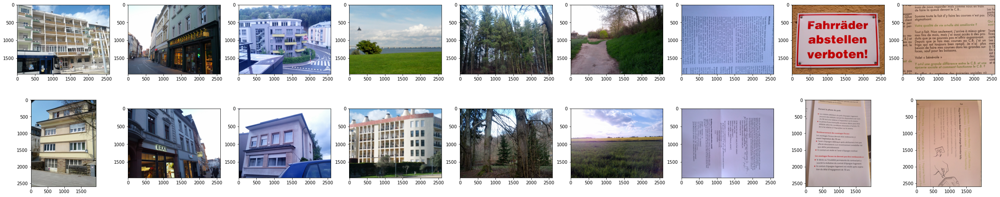

In [27]:
fig, axes = plt.subplots(2, 9, figsize=(40, 8))
for ci, i in enumerate(range(0, 90, 10)):
    query = images[i]
    dists_query = dists[i]
    closest = dists_query.argsort()
    # closest[0] is same as the query image, so pick next closest
    closest = closest[1]
    result = images[closest]
    query = mh.imread(query)
    result = mh.imread(result)
    axes[0, ci].imshow(query)
    axes[1, ci].imshow(result)
plt.show()

It is clear that the system is not perfect, but can find images that are at least visually similar to the queries. In all but one case, the image found comes from the same class as the query.

## Classifying a harder dataset

The previous dataset was an easy dataset for classification using texture features. However, sometimes a tougher problem may be faced and need better and more modern techniques to get good results. 

A public dataset will be now tested, which has the same structure: several photographs split into a small number of classes. The classes are animals, cars, transportation, and natural scenes.

When compared to the three-class problem which discussed previously, these classes are harder to tell apart. The following is one example from the animal class:
# ![Example from the animal class](./Example%20from%20the%20animal%20class.PNG)

And here is another example from the car class:
# ![Example from the car class](./Example%20from%20the%20car%20class.PNG)

Both objects are against natural backgrounds, and with large, smooth areas inside the objects. This is a harder problem than the previous dataset, so it will be needed to use more advanced methods. The first improvement will be to use a slightly more powerful classifier. The logistic regression that scikit-learn provides is a penalized form of logistic regression, which contains an adjustable parameter, C. By default, C = 1.0, but this may not be optimal. A grid search can be used to find a good value for this parameter as follows:

In [28]:
from sklearn.model_selection import GridSearchCV

C_range = 10.0 ** np.arange(-4, 3)
grid = GridSearchCV(LogisticRegression(max_iter=3000), param_grid={'C' : C_range})
clf = Pipeline([('preproc', StandardScaler()), ('classifier', grid)])

The data is not organized in a random order inside the dataset: similar images are close together. Thus, a cross-validation schedule that considers the data shuffled is used so that each fold has a more representative training set, as shown in the following code:

In [29]:
basedir = './AnimTransDistr/'

classes = [
    'Anims',
    'Cars',
    'Distras',
    'Trans',
]

images = []
labels = []
for ci, cl in enumerate(classes):
    current = glob('{}/{}/*.jpg'.format(basedir, cl))
    for im in sorted(current):
        labels.append(cl)
        images.append(im)

print('Computing whole-image texture features [can take a while]...')
ifeatures = []
for im in images:
    im = mh.imread(im)
    img = mh.colors.rgb2grey(im).astype(np.uint8)
    fs = np.concatenate([mh.features.haralick(img).ravel(), chist(im)])
    ifeatures.append(fs)

ifeatures = np.array(ifeatures)
labels = np.array(labels)

cv = model_selection.KFold(n_splits=5, shuffle=True, random_state=123)
scores = model_selection.cross_val_score(clf, ifeatures, labels, cv=cv)
print('Accuracy: {:.1%}'.format(scores.mean()))

Computing whole-image texture features [can take a while]...
Accuracy: 72.8%


This is not so bad for four classes, but it will be now seen if it can be done better by using a different set of features. In fact, it will be seen that it is needed to combine these features with other methods to get the best possible results.

## Local feature representations

Unlike the previous features that was used, local features are computed on a small region of the image. Mahotas supports computing types of features called Speeded Up Robust Features (SURF). These features are designed to be robust against rotational or illumination changes (that is, they only change their values slightly when illumination changes).

When using these features, it is needed to decide where to compute them. There are three possibilities that are commonly used:
* Randomly
* In a grid
* Detecting interesting areas of the image (a technique known as keypoint detection or interest point detection)

All of these are valid and will, under the right circumstances, give good results. Using interest point detection works best if there is a reason to expect that the interest point will correspond to areas of importance in the image.

The interest point method will be being used. Computing the features with mahotas is easy: import the right submodule and call the surf.surf function as follows:

In [30]:
from mahotas.features import surf

im = images[0]
im = mh.imread(im, as_grey=True)
im = im.astype(np.uint8)
descriptors = surf.surf(im, descriptor_only=True)

The descriptors_only=True flag means that it is only interested in the local features themselves, and not in their pixel location, size, or orientation (the word descriptor is often used to refer to these local features). Alternatively, the dense sampling method could have been used, using the surf.dense function as follows:

In [31]:
descriptors = surf.dense(im, spacing=16)

This returns the value of the descriptors computed on points that are at a distance of 24 pixels from each other. The number of points depends on the size of the images, their content, and the parameters you pass to the functions. In this example, the default settings are being used, and a few hundred descriptors per image are obtained.

These descriptors cannot be directly fed to a support vector machine, logistic regressor, or similar classification system. They could be just averaged, but the results of doing so are not very good as they throw away all location-specific information. In that case, It would have just another global feature set based on edge measurements.

The solution that will be used here is the bag of words model. It was published first in 2004, but this is one of those obvious-in-hindsight ideas; it is very simple to implement and achieves very good result.

It may seem strange to speak of words when dealing with images. It may be easier to understand if thinking that there are no written words, which are easy to distinguish from each other, but orally spoken audio. Now, each time a word is spoken, it will sound slightly different, and different speakers will have their own pronunciation. However, by using clustering on these waveforms, it is possible to recover most of the structure so that all the instances of a given word are in the same cluster. Even if the process is not perfect (and it will not be), the waveforms can be still talked of grouping into words.

The same operation is performed with image data: similar-looking regions are clustered together from all images and call these visual words.

The number of words used does not usually have a big impact on the final performance of the algorithm. Naturally, if the number is extremely small (10 or 20, when there is a few thousand images), then the overall system will not perform well. Similarly, if there are too many words (many more than the number of images, for example), the system will also not perform well. As a rule of thumb, using a value such as 256, 512, or 1,024 if there are many images should give a good result.

Start by computing the features as follows:

In [32]:
alldescriptors = []
for im in images:
    im = mh.imread(im, as_grey=True)
    im = im.astype(np.uint8)
    alldescriptors.append((surf.surf(im, descriptor_only=True)))
# get all descriptors into a single array
concatenated = np.concatenate(alldescriptors)

Now, k-means clustering is used to obtain the centroids. There are several million descriptors and it would not be wrong to use them all. However, it would require much more computation for little extra benefit. The sampling and clustering is as shown in the following code:

In [33]:
from sklearn.cluster import KMeans

# use only every 64th vector
concatenated = concatenated[::64]
k = 256
km = KMeans(k)
km.fit(concatenated)

KMeans(n_clusters=256)

After this is done (which will take a while), the km object contains information about the centroids. Now go back to the descriptors and build feature vectors as follows:

In [34]:
sfeatures = []
for d in alldescriptors:
    c = km.predict(d)
    sfeatures.append(np.bincount(c, minlength=256))
# build single array and convert to float
sfeatures = np.array(sfeatures, dtype=float)

The end result of this loop is that sfeatures[fi, fj] is the number of times that the image fi contains the element fj. The result is converted to floating point as integer arithmetic is not wanted (with its rounding semantics).

The result is that each image is now represented by a single array of features of the same size (the number of clusters in our case is 256). Therefore, the standard classification methods can be used as follows:

In [35]:
scores = model_selection.cross_val_score(clf, sfeatures, labels, cv=cv)
print('Accuracy: {:.1%}'.format(scores.mean()))

Accuracy: 63.1%


This is worse than before! Has it resulted nothing?

In fact, it has, as all features can be combined together to obtain 76.7 percent accuracy, as follows:

In [36]:
allfeatures = np.hstack([ifeatures, sfeatures])
scores = model_selection.cross_val_score( clf, allfeatures, labels, cv=cv)
print('Accuracy: {:.1%}'.format(scores.mean()))

Accuracy: 76.7%


This is the best result, better than any single feature set. This is due to the fact that the local SURF features are different enough to add new information to the global image features before and improve the combined result.

## Image generation with adversarial networks

Generative Adversarial Networks (GANs) are a new, trendy type of network. Their main attraction is the Generative side. This means that a network can be trained to generate a new
sample of data that is similar to a reference.

A few years ago, researchers used Deep Belief Networks (DBN) for this task, consisting of a visible layer and then a set of internal layers that ended up recurrent. Training such networks was quite difficult, so people thought about new architectures.

Enter the GAN. First, it is needed to design a generator network. Typically, a set of random variables is needed that will be fed inside a set of dense and conv2d_transpose layers. The latter do the opposite of the conv2d layer, going from an input that looks like a convoluted output to an output that looks like a convolution input.

Now, to train this network, the Adversarial part is used. The trick is to train another network, a discriminator, to detect whether a sample is a real sample or a generated sample. One iteration will train the discriminator to enhance its discrimination power, and the iteration after will train the generator to get an image closer to a real one. 

Try to generate realistic handwritten digits; some parts of the previous CNN classifier will reused. It is needed to add a generator there and change the layers to take into account the additional random input that will generate the images.

Start with some helper functions: a match helper for the cost function as well as a function to write the newly generated samples to disk and display then during the training session. The custom layer is also created for batch normalization to simplify the underlying computation:

In [37]:
import tensorflow as tf

def match(logits, labels):
    logits = tf.clip_by_value(logits, 1e-7, 1. - 1e-7)
    return tf.math.reduce_mean(tf.keras.losses.BinaryCrossentropy(from_logits=True)(logits, labels))

Use the binary cross entropy, BinaryCrossentropy. As there is only one output value, this is simple to handle.

In [38]:
def show_visualization(X, nh_nw):
    plt.figure(num=None, figsize=(10, 40))
    h,w = X.shape[1], X.shape[2]
    img = np.zeros((h * nh_nw[0], w * nh_nw[1], 3))

    for n,x in enumerate(X):
        j = n // nh_nw[1]
        i = n % nh_nw[1]
        img[j*h:j*h+h, i*w:i*w+w, :] = x / 255

    plt.imshow(img)
    plt.show()

As the sigmoid mapping function are being used for probabilities, it is needed to remove values 0 and 1 from the mapping (as they map from infinity). Thas is done by adding 1e-7 to 0 and subtracting it from 1. Now create the class, creating the model. The constructor will have additional new parameters, the number of classes Y, as well as the size of a random state Z. There is a new special layer for the generator that will create good images—the convolution transpose layer that was talked about earlier. The discriminator should return a probability between 0 and 1 of being a real image. To accomplish this and to allow the generator to create various types of images, drive into the discriminator the image, and also their classes on each layer. As it was said before, the generator does the opposite, going from the class variables and random state to the final generated image with values between 0 and 1. It is now time to assemble the pieces. The image generator is then created (which it will be used to show the generated images) and then the discriminators. Here lies the trick. Two of them are created at the same time. One is used for the real images and should return 1; the other will be fed the generated images and should return 0. As the two share the same weights, the reuse flag is passed for the second discriminator. The cost which is tried to be optimized for the discriminator step is the sum of the discrepancies of the two discriminators and for the generator. As it was said, the generator is optimized to get a 1 on the discriminator:

In [39]:
class DCGAN():
    def __init__(self, image_shape=[28, 28, 1], dim_z=100, dim_y=10, dim_W1=1024, dim_W2=128, dim_W3=64, dim_channel=1, train_op_gen=None, train_op_discrim=None):
        self.image_shape = image_shape
        self.dim_z = dim_z
        self.dim_y = dim_y
        self.dim_W1 = dim_W1
        self.dim_W2 = dim_W2
        self.dim_W3 = dim_W3
        self.dim_channel = dim_channel
        self.train_op_gen = train_op_gen
        self.train_op_discrim = train_op_discrim
        self.generator_model = self.generate()
        self.discriminator_model = self.discriminate()

    def create_conv2d_transpose(self, input, filters, kernel_size, name, with_batch_norm):
        layer = tf.keras.layers.Conv2DTranspose(filters=filters, kernel_size=kernel_size, strides=(2, 2), name="Conv2d_transpose_" + name, padding="same")(input)
        if with_batch_norm:
            layer = tf.keras.layers.BatchNormalization()(layer)
            layer = tf.keras.layers.ReLU(name="RELU_" + name)(layer)
        return layer

    def create_conv2d(self, input, filters, kernel_size, name):
        layer = tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, strides=(2, 2), name="Conv2d_" + name, padding="same")(input)
        layer = tf.keras.layers.LeakyReLU(name= "LeakyRELU" + name)(layer)
        return layer
    
    def create_dense(self, input, units, name, leaky):
        layer = tf.keras.layers.Dense(units=units, name="Dense" + name)(input)
        layer = tf.keras.layers.BatchNormalization()(layer)
        if leaky:
            layer = tf.keras.layers.LeakyReLU(name= "LeakyRELU" + name)(layer)
        else:
            layer = tf.keras.layers.ReLU(name="RELU_" + name)(layer)
        return layer

    def discriminate(self):
        img_inputs = tf.keras.Input(shape=self.image_shape)
        h1 = self.create_conv2d(img_inputs, self.dim_W3, 5, "Layer1")
        h2 = self.create_conv2d(h1, self.dim_W2, 5, "Layer2")
        h2 = tf.keras.layers.Reshape((7, 7, self.dim_W2))(h2)
        h3 = self.create_dense(h2, self.dim_W1, "Layer3", True)
        h4 = tf.keras.layers.Dense(units=1, name="DenseLayer4")(h3)
        model = tf.keras.Model(inputs=img_inputs, outputs=h4, name="discr_model")
        return model

    def generate(self):
        inputs = tf.keras.Input(shape=(self.dim_z,))
        h1 = self.create_dense(inputs, self.dim_W1, "Layer1", False)
        h2 = self.create_dense(h1, self.dim_W2 * 7 * 7, "Layer2", False)
        h2 = tf.keras.layers.Reshape((7, 7, self.dim_W2))(h2)
        h3 = self.create_conv2d_transpose(h2, self.dim_W3, 5, "Layer3", True)
        h4 = self.create_conv2d_transpose(h3, self.dim_channel, 7, "Layer4", False)
        x = tf.keras.layers.Activation('sigmoid')(h4)
        model = tf.keras.Model(inputs=inputs, outputs=x, name="gen_model")
        return model

    def train_step(self, X, Z, training):
        with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
            image_gen = self.generator_model(Z, training=training)
            raw_real = self.discriminator_model(X, training=training)
            raw_gen = self.discriminator_model(image_gen, training=training)
            discrim_cost_real = match(tf.ones_like(raw_real), raw_real)
            discrim_cost_gen = match(tf.zeros_like(raw_gen), raw_gen)
            discrim_cost = discrim_cost_real + discrim_cost_gen
            gen_cost = match(tf.ones_like(raw_gen), raw_gen)
        gen_vars = self.generator_model.trainable_variables
        discrim_vars = self.discriminator_model.trainable_variables
        image_gen_gradients = gen_tape.gradient(gen_cost, gen_vars)
        raw_real_gradients = disc_tape.gradient(discrim_cost, discrim_vars)
        self.train_op_gen.apply_gradients(zip(image_gen_gradients, gen_vars))
        self.train_op_discrim.apply_gradients(zip(raw_real_gradients, discrim_vars))
        return image_gen, discrim_cost, gen_cost

Now start setting up the graph with the hyperparameters:

In [40]:
n_epochs = 50
learning_rate = 0.0002
batch_size = 1024
image_shape = [28, 28, 1]
dim_z = 100
dim_y = 10
dim_W1 = 1024
dim_W2 = 128
dim_W3 = 64
dim_channel = 1
visualize_dim = 196
step = 200

As before, the MNIST dataset is read:

In [41]:
from sklearn.datasets import fetch_openml

mnist = fetch_openml('mnist_784')
mnist.data = mnist.data.astype(np.float32).values.reshape([-1, 28, 28, 1]) / 255.
mnist.num_examples = len(mnist.data)

And the graph is created. The variables are also created for the samples to check if whether the generator has started generating recognizable images:

In [42]:
train_op_gen = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5)
train_op_discrim = tf.keras.optimizers.Adam(learning_rate, beta_1=0.5)
dcgan_model = DCGAN(image_shape=image_shape, dim_z=dim_z, dim_W1=dim_W1, dim_W2=dim_W2, dim_W3=dim_W3, train_op_gen=train_op_gen, train_op_discrim=train_op_discrim)
Z_np_sample = np.random.uniform(-1, 1, size=(visualize_dim, dim_z))

Random numbers are generated for the generated images for each batch, and the discriminator is optimized and then the generator, as it was planned:

epoch: 0
 batch: 0


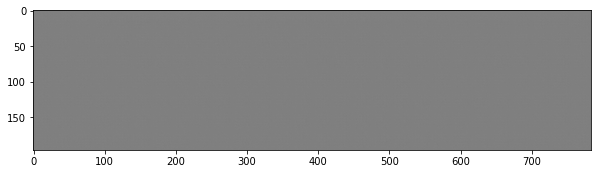

 batch: 25600


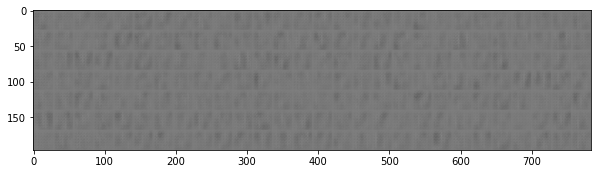

 batch: 51200


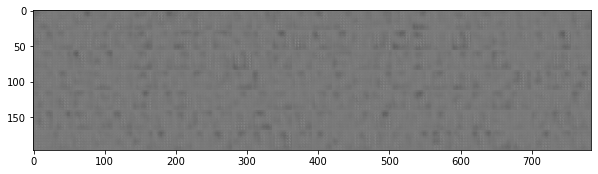

epoch: 1
 batch: 0


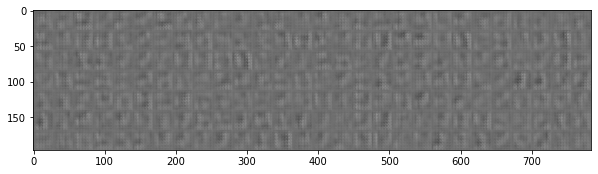

 batch: 25600


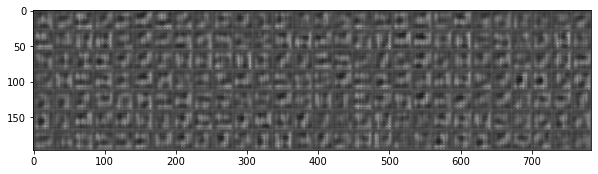

 batch: 51200


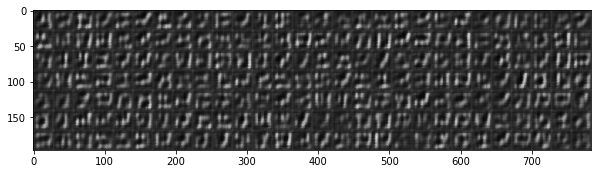

epoch: 2
 batch: 0


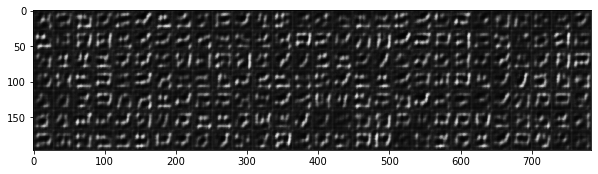

 batch: 25600


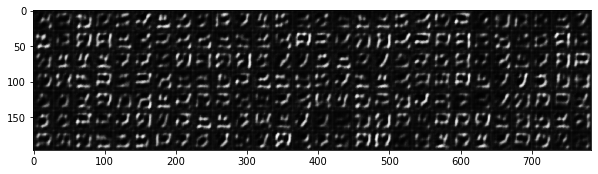

 batch: 51200


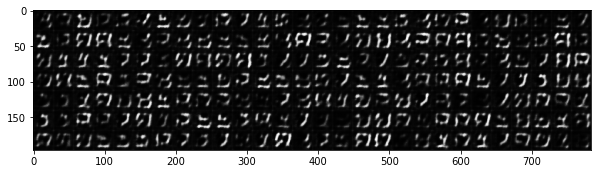

epoch: 3
 batch: 0


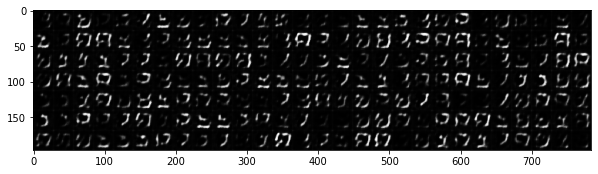

 batch: 25600


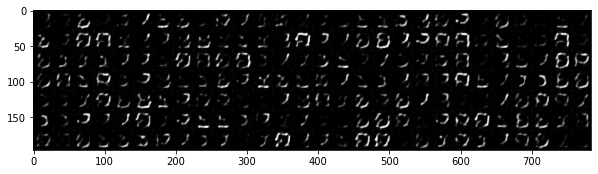

 batch: 51200


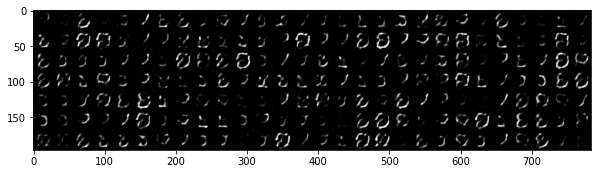

epoch: 4
 batch: 0


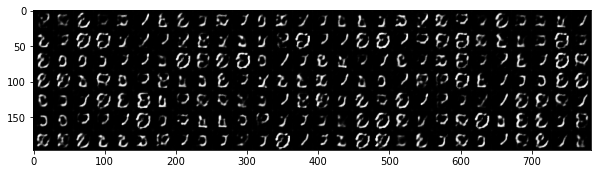

 batch: 25600


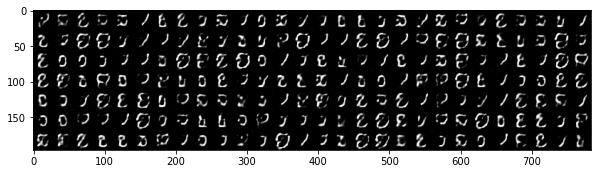

 batch: 51200


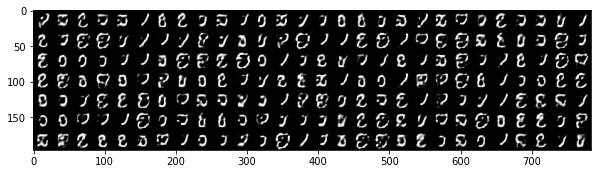

epoch: 5
 batch: 0


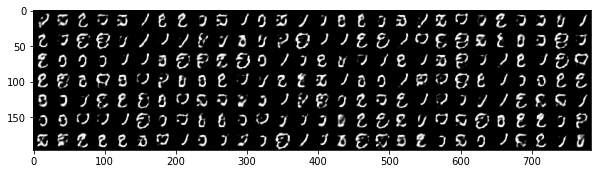

 batch: 25600


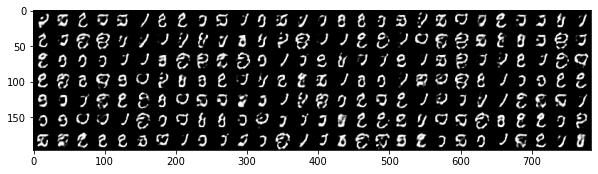

 batch: 51200


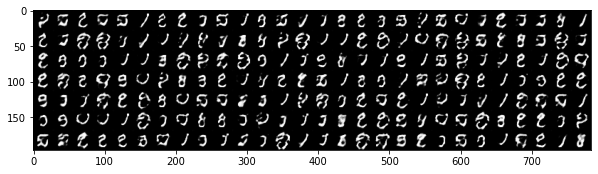

epoch: 6
 batch: 0


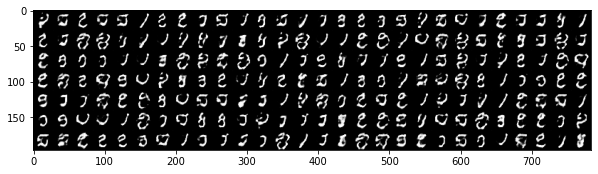

 batch: 25600


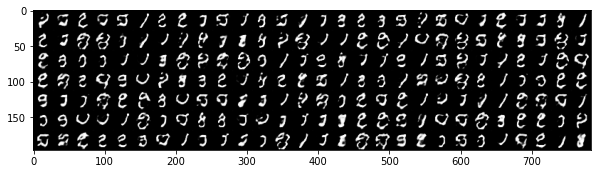

 batch: 51200


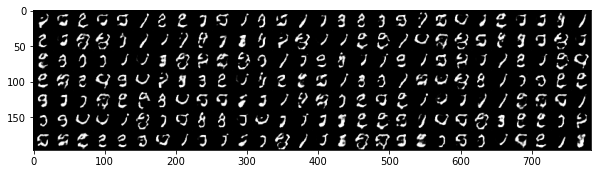

epoch: 7
 batch: 0


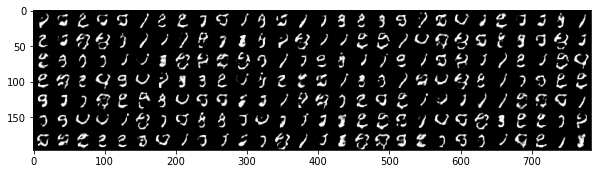

 batch: 25600


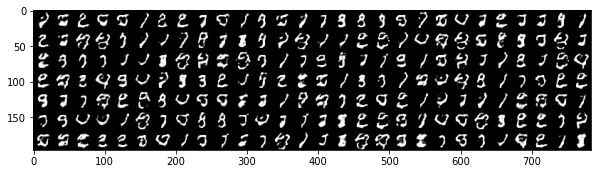

 batch: 51200


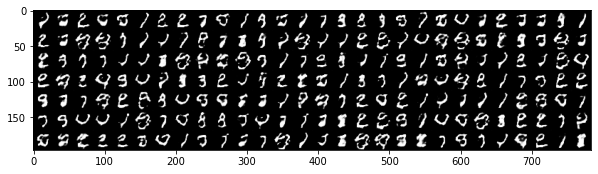

epoch: 8
 batch: 0


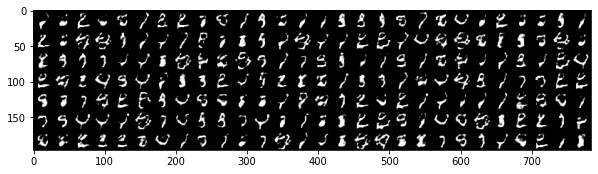

 batch: 25600


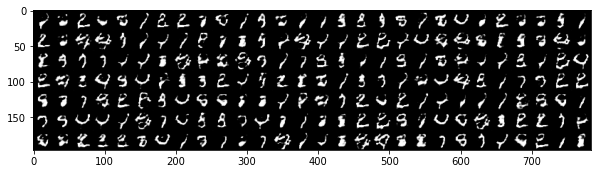

 batch: 51200


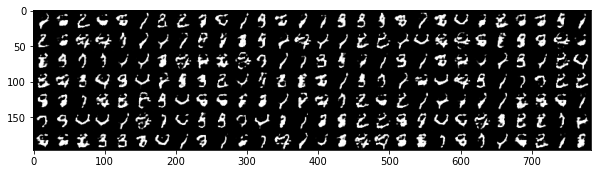

epoch: 9
 batch: 0


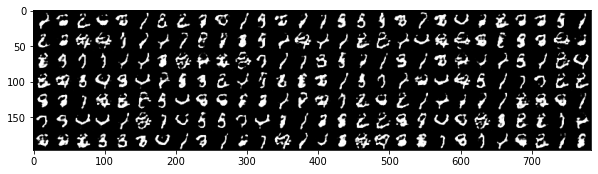

 batch: 25600


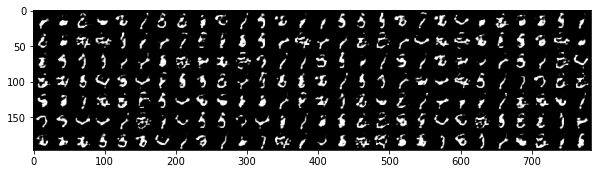

 batch: 51200


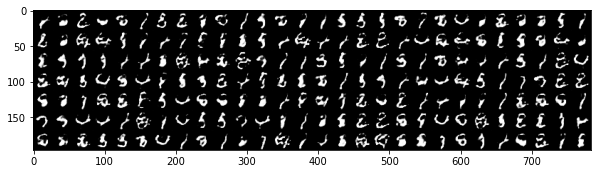

epoch: 10
 batch: 0


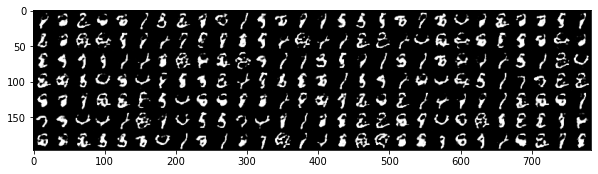

 batch: 25600


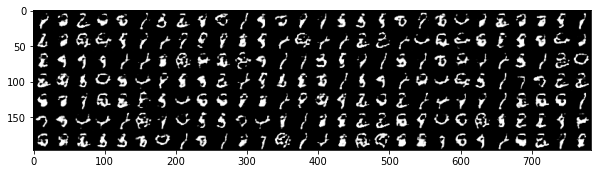

 batch: 51200


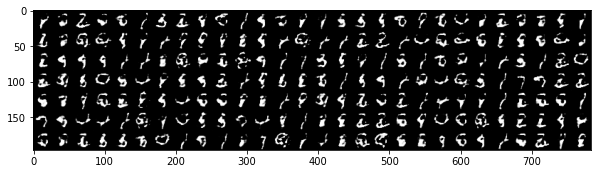

epoch: 11
 batch: 0


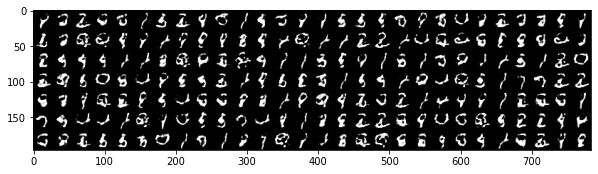

 batch: 25600


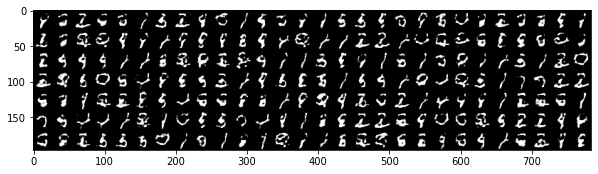

 batch: 51200


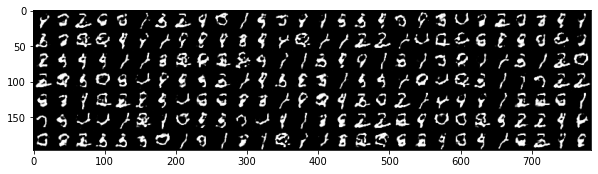

epoch: 12
 batch: 0


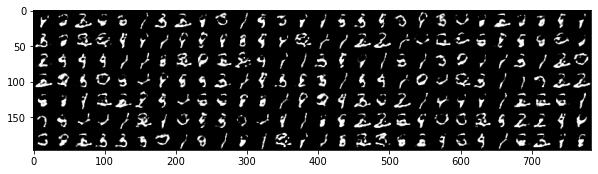

 batch: 25600


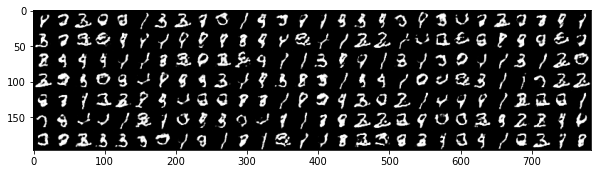

 batch: 51200


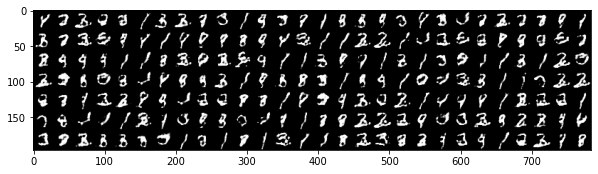

epoch: 13
 batch: 0


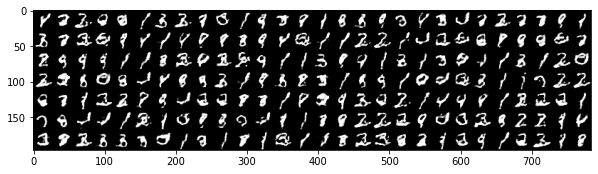

 batch: 25600


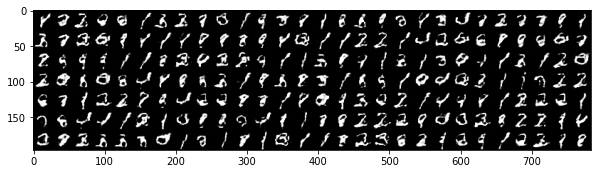

 batch: 51200


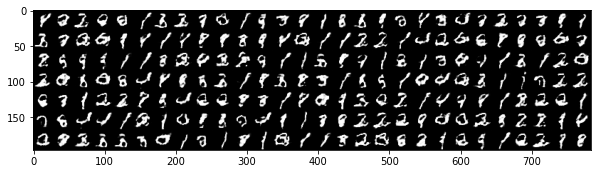

epoch: 14
 batch: 0


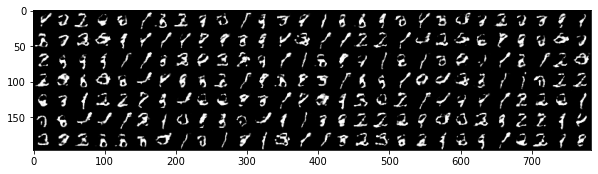

 batch: 25600


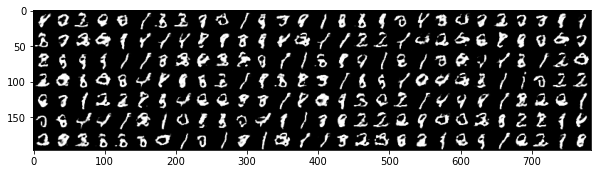

 batch: 51200


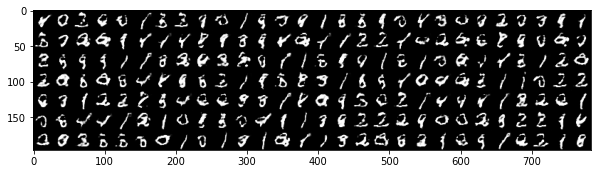

epoch: 15
 batch: 0


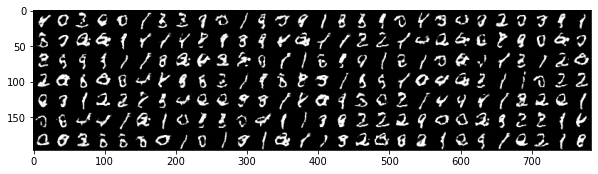

 batch: 25600


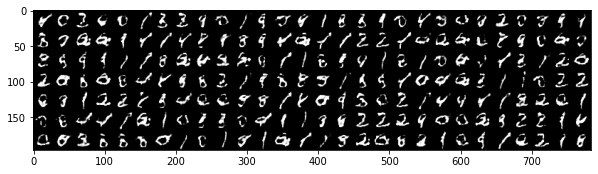

 batch: 51200


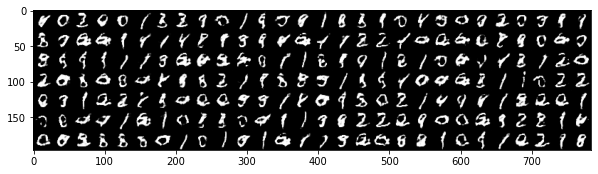

epoch: 16
 batch: 0


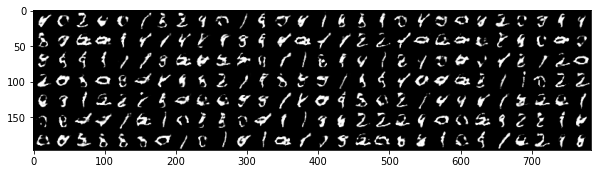

 batch: 25600


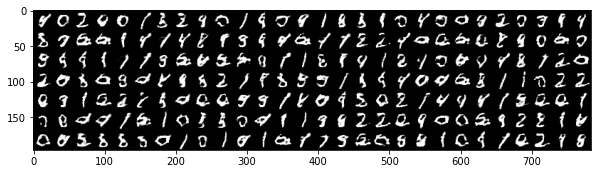

 batch: 51200


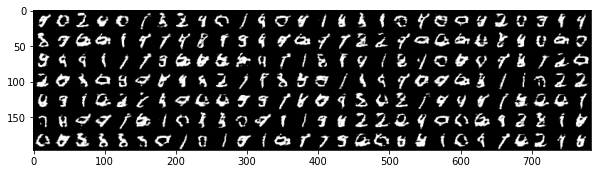

epoch: 17
 batch: 0


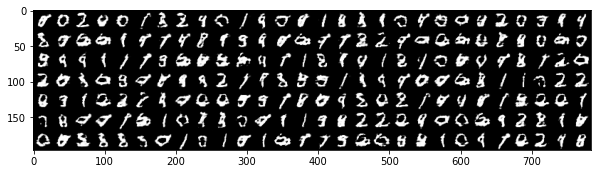

 batch: 25600


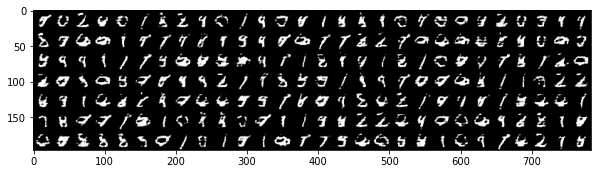

 batch: 51200


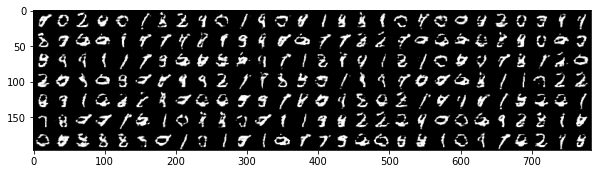

epoch: 18
 batch: 0


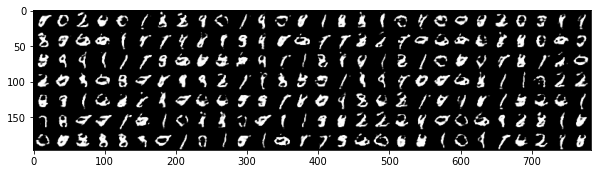

 batch: 25600


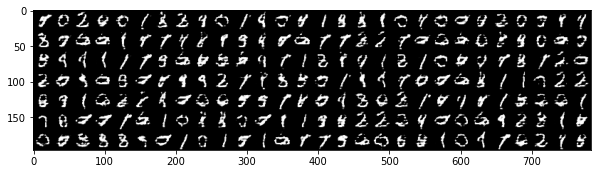

 batch: 51200


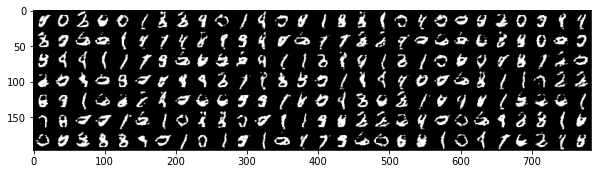

epoch: 19
 batch: 0


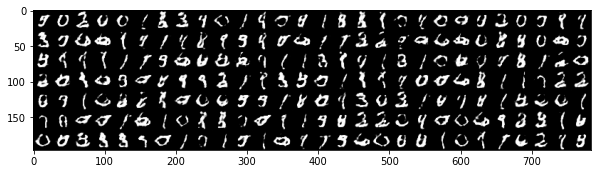

 batch: 25600


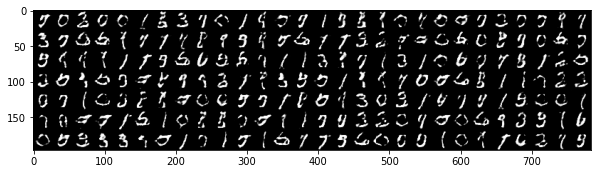

 batch: 51200


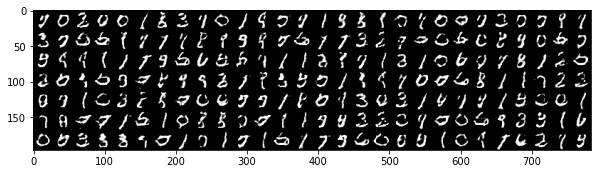

epoch: 20
 batch: 0


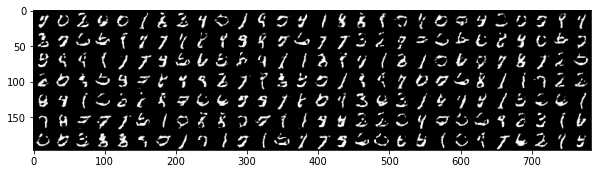

 batch: 25600


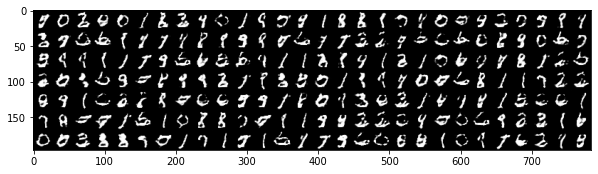

 batch: 51200


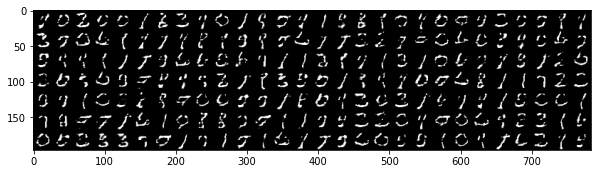

epoch: 21
 batch: 0


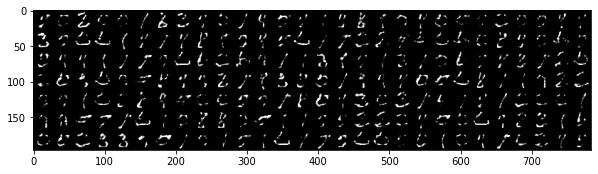

 batch: 25600


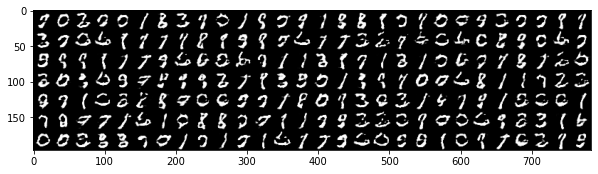

 batch: 51200


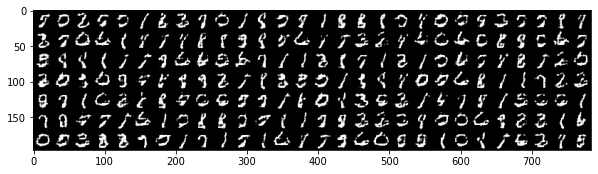

epoch: 22
 batch: 0


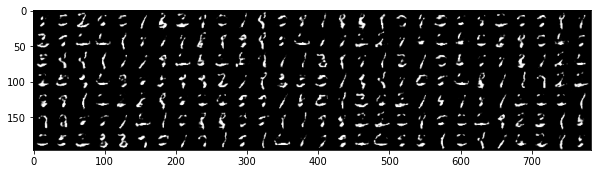

 batch: 25600


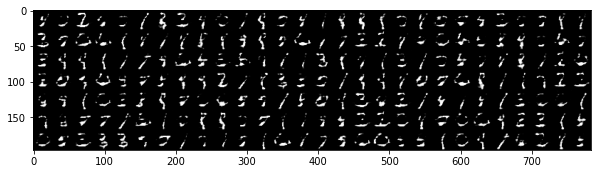

 batch: 51200


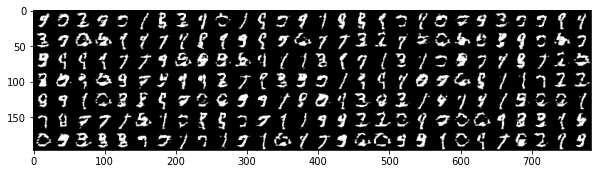

epoch: 23
 batch: 0


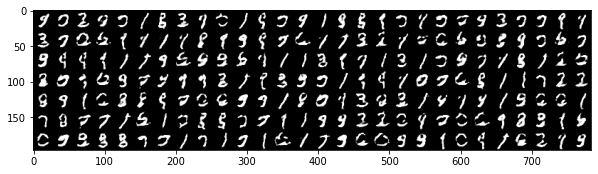

 batch: 25600


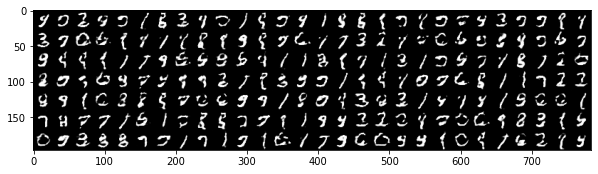

 batch: 51200


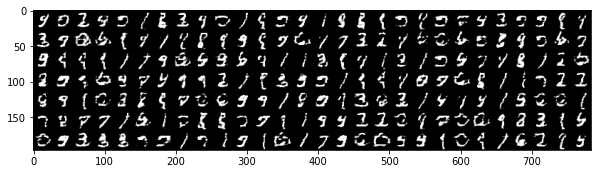

epoch: 24
 batch: 0


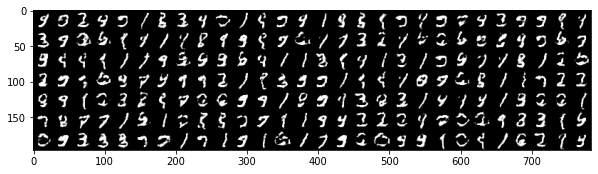

 batch: 25600


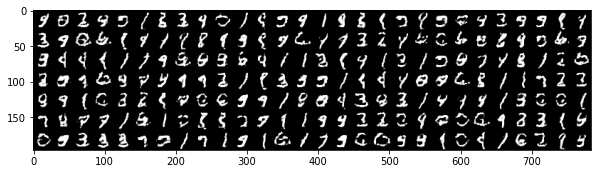

 batch: 51200


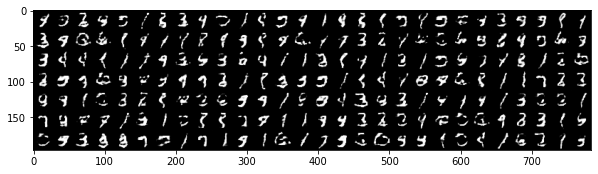

epoch: 25
 batch: 0


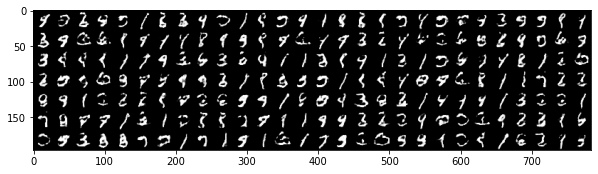

 batch: 25600


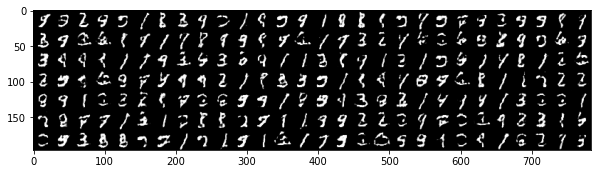

 batch: 51200


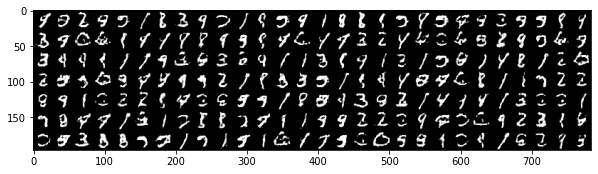

epoch: 26
 batch: 0


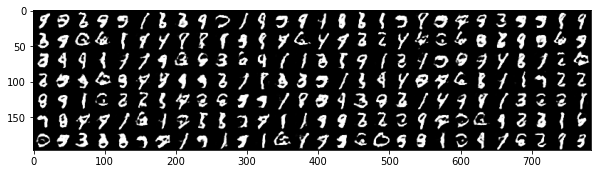

 batch: 25600


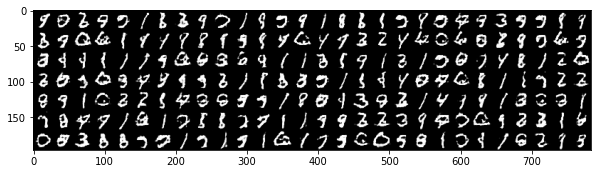

 batch: 51200


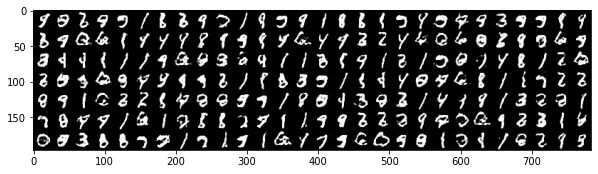

epoch: 27
 batch: 0


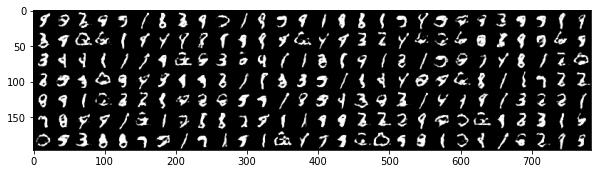

 batch: 25600


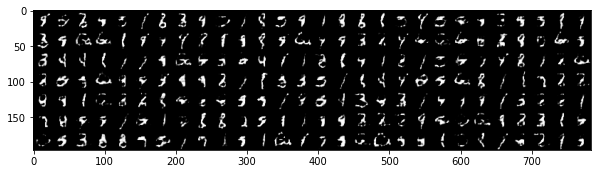

 batch: 51200


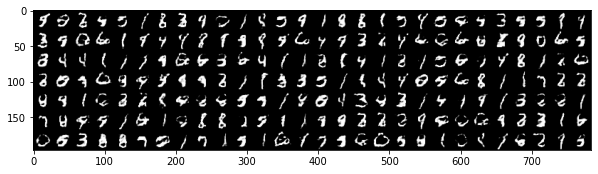

epoch: 28
 batch: 0


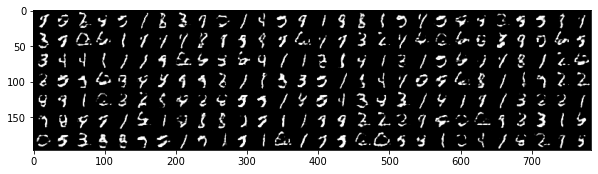

 batch: 25600


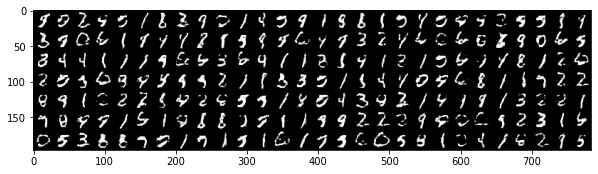

 batch: 51200


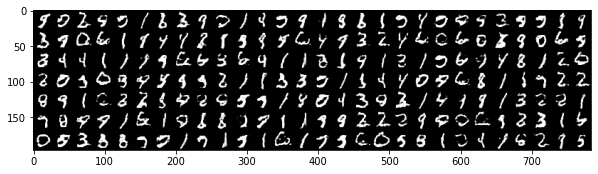

epoch: 29
 batch: 0


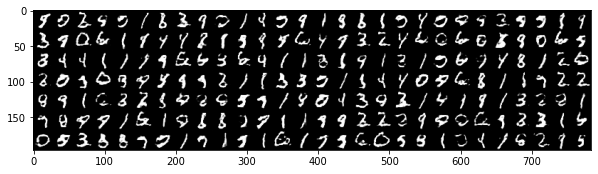

 batch: 25600


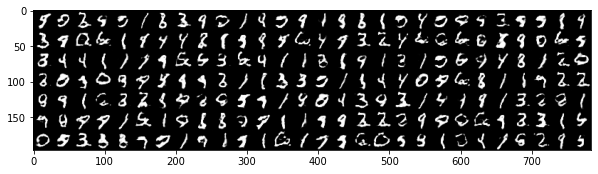

 batch: 51200


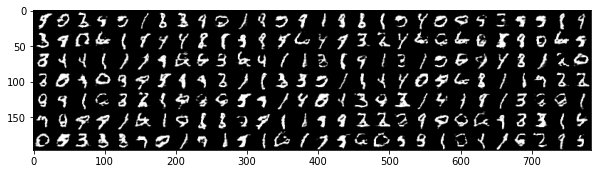

epoch: 30
 batch: 0


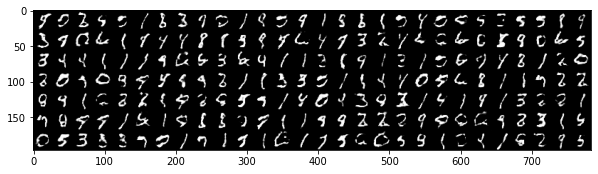

 batch: 25600


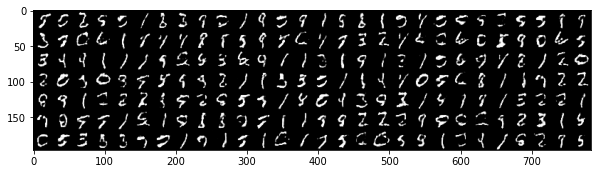

 batch: 51200


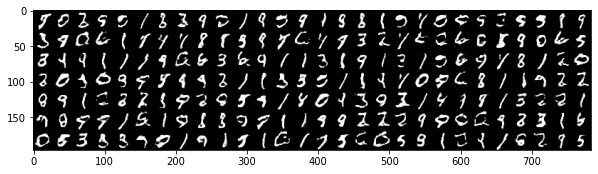

epoch: 31
 batch: 0


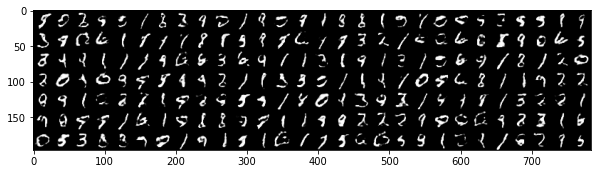

 batch: 25600


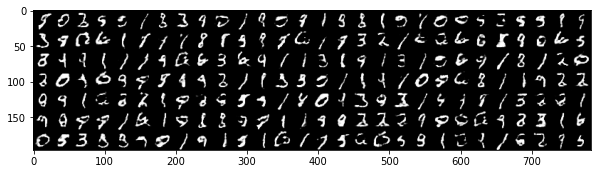

 batch: 51200


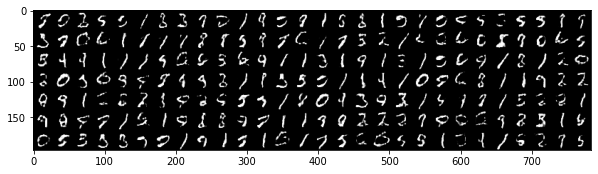

epoch: 32
 batch: 0


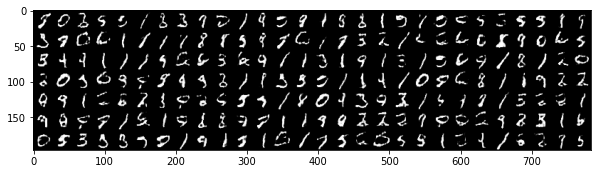

 batch: 25600


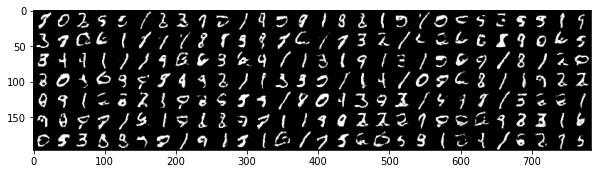

 batch: 51200


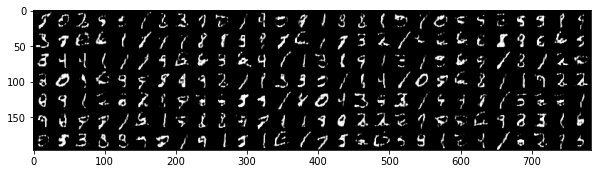

epoch: 33
 batch: 0


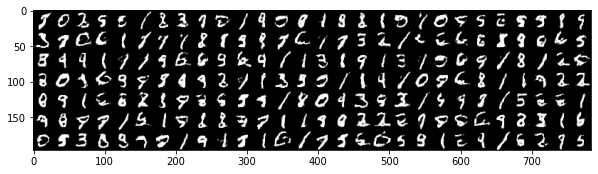

 batch: 25600


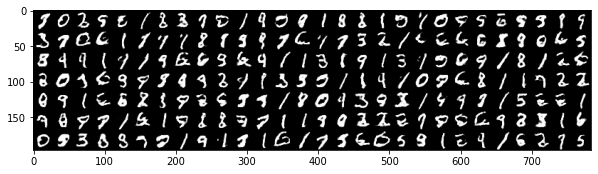

 batch: 51200


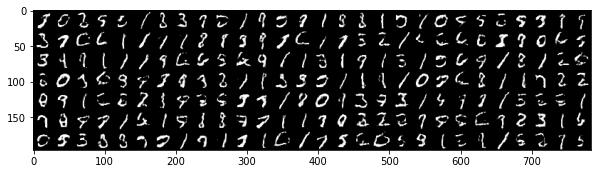

epoch: 34
 batch: 0


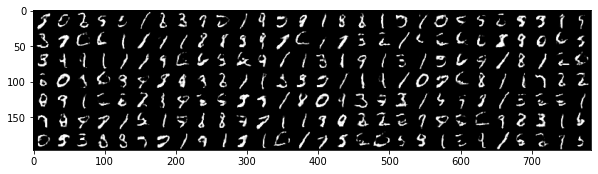

 batch: 25600


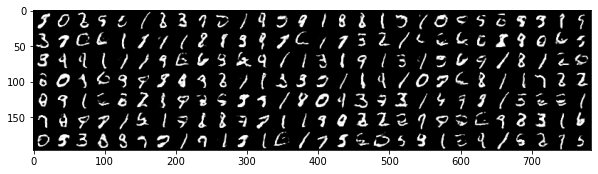

 batch: 51200


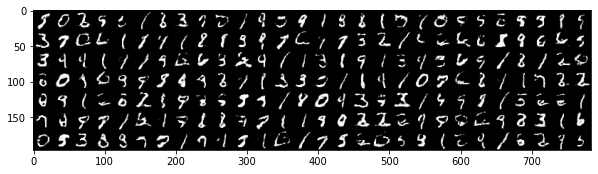

epoch: 35
 batch: 0


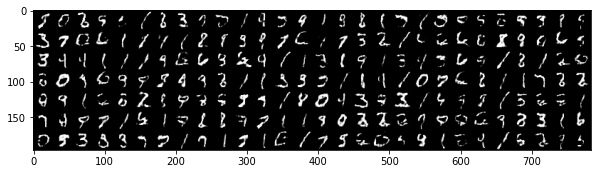

 batch: 25600


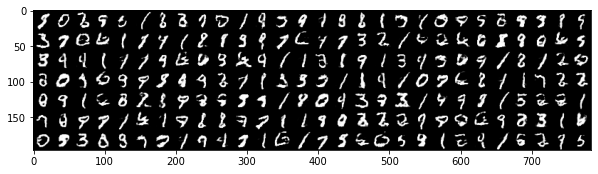

 batch: 51200


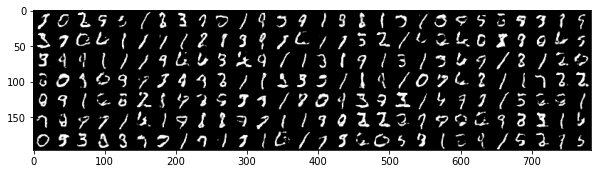

epoch: 36
 batch: 0


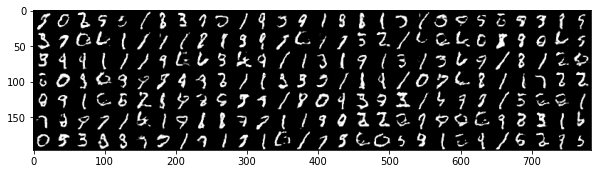

 batch: 25600


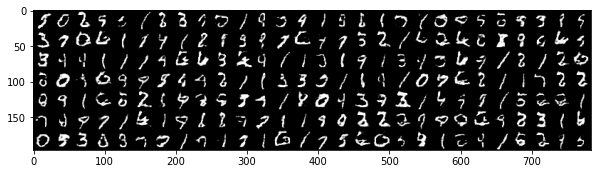

 batch: 51200


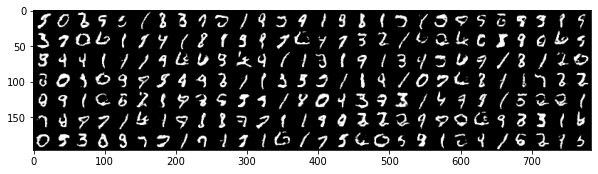

epoch: 37
 batch: 0


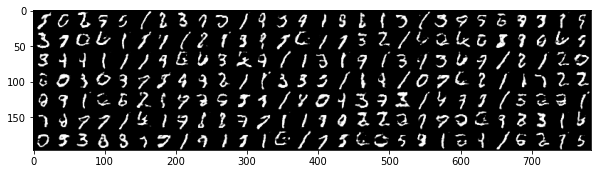

 batch: 25600


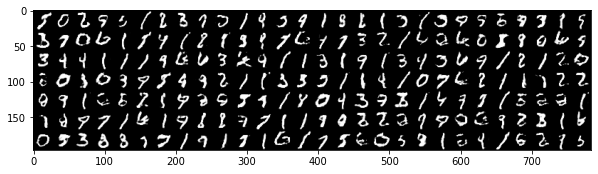

 batch: 51200


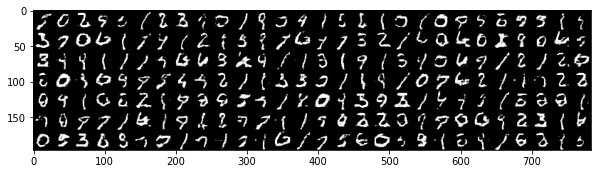

epoch: 38
 batch: 0


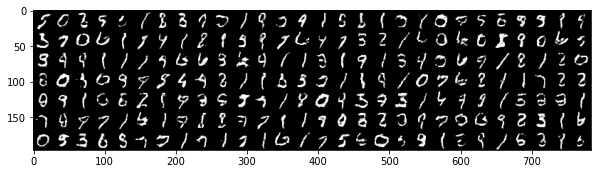

 batch: 25600


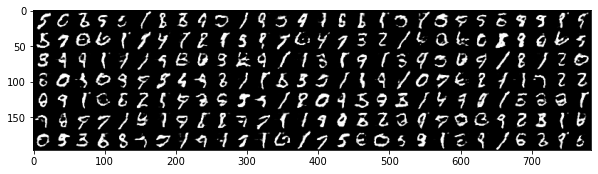

 batch: 51200


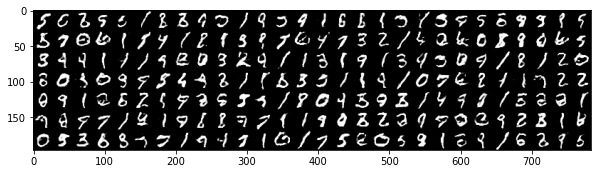

epoch: 39
 batch: 0


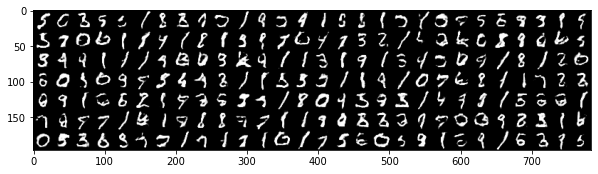

 batch: 25600


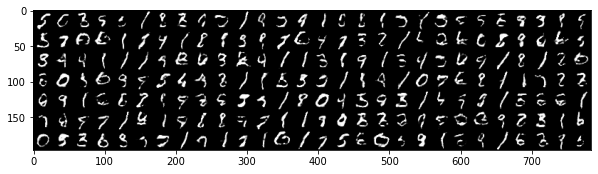

 batch: 51200


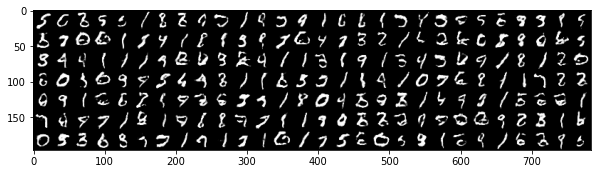

epoch: 40
 batch: 0


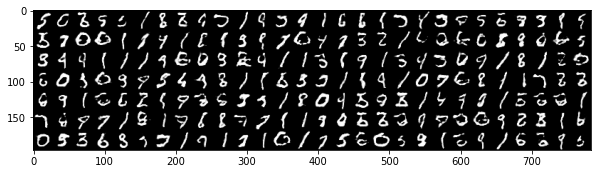

 batch: 25600


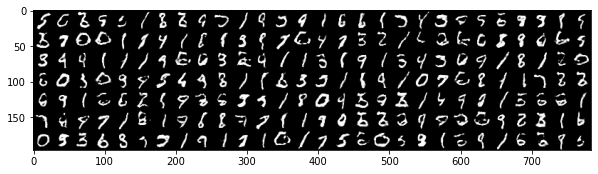

 batch: 51200


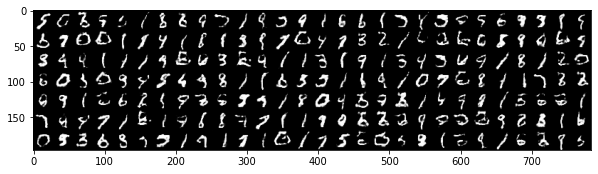

epoch: 41
 batch: 0


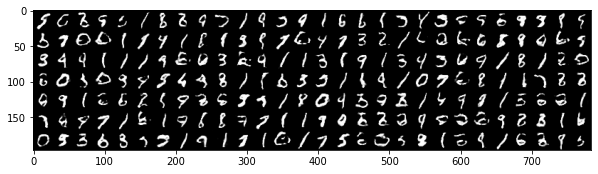

 batch: 25600


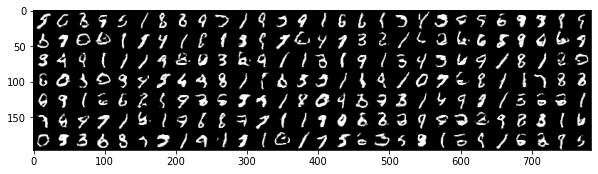

 batch: 51200


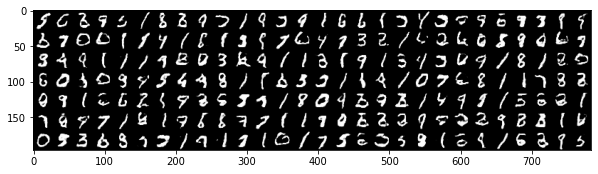

epoch: 42
 batch: 0


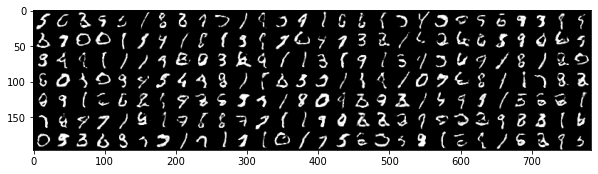

 batch: 25600


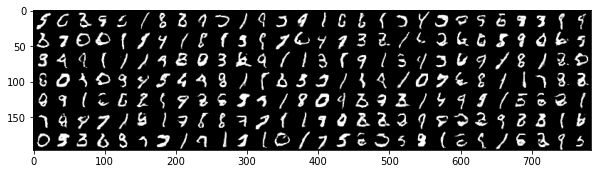

 batch: 51200


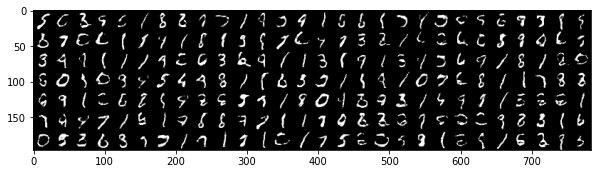

epoch: 43
 batch: 0


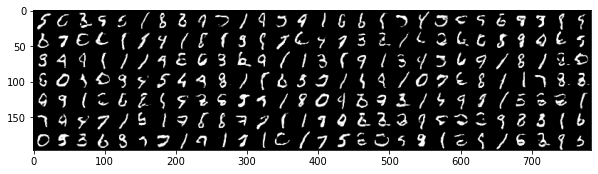

 batch: 25600


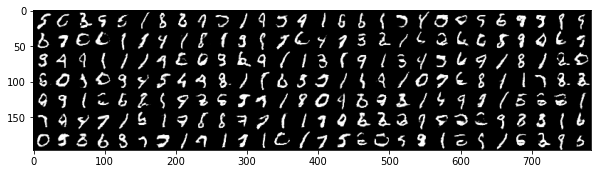

 batch: 51200


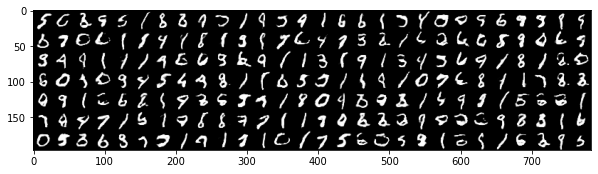

epoch: 44
 batch: 0


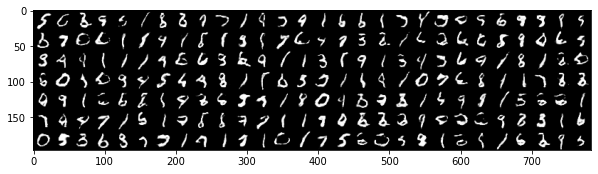

 batch: 25600


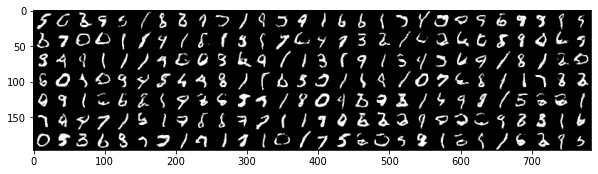

 batch: 51200


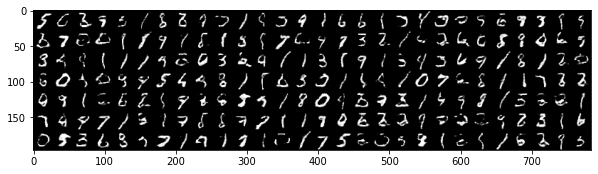

epoch: 45
 batch: 0


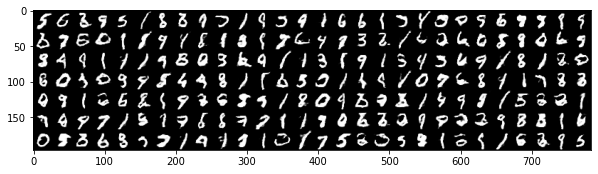

 batch: 25600


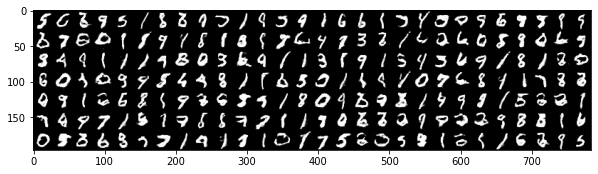

 batch: 51200


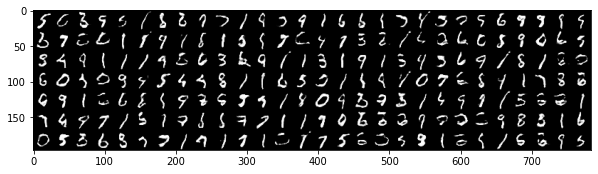

epoch: 46
 batch: 0


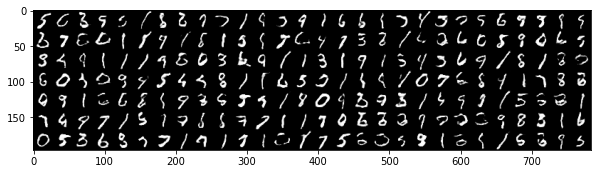

 batch: 25600


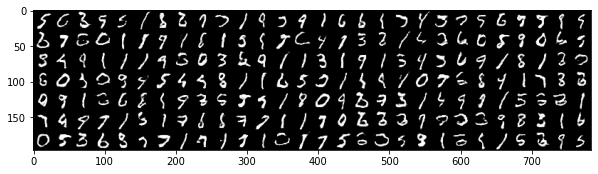

 batch: 51200


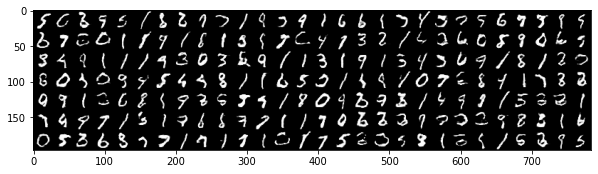

epoch: 47
 batch: 0


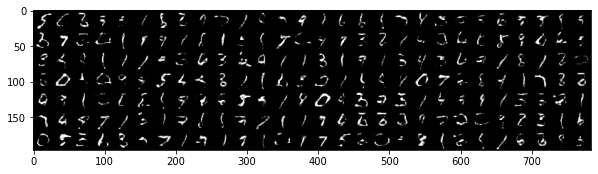

 batch: 25600


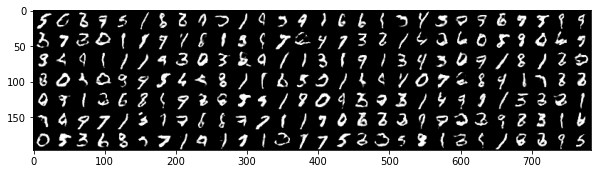

 batch: 51200


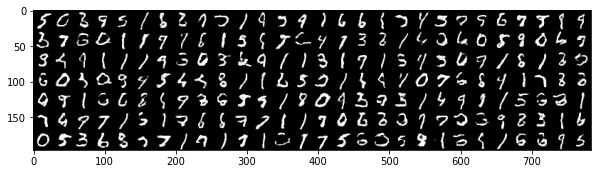

epoch: 48
 batch: 0


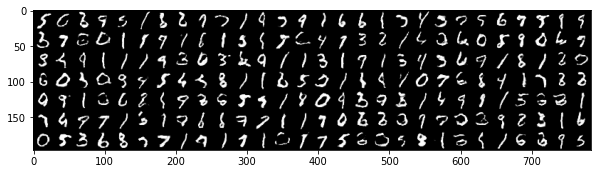

 batch: 25600


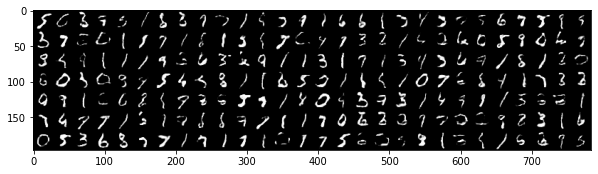

 batch: 51200


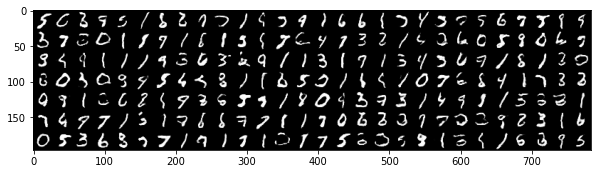

epoch: 49
 batch: 0


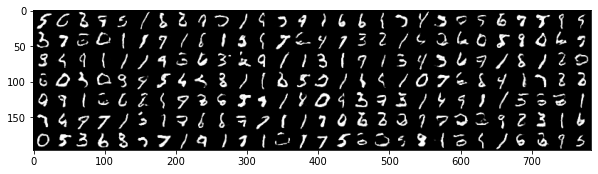

 batch: 25600


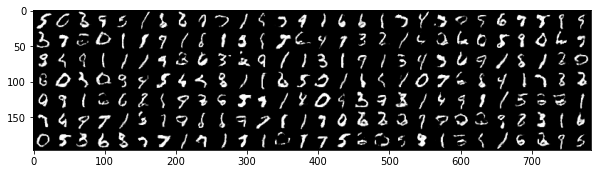

 batch: 51200


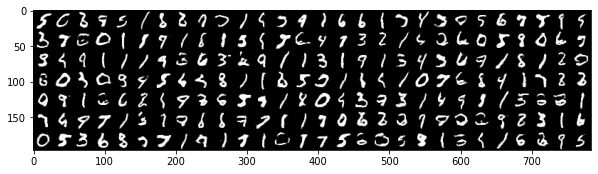

In [43]:
for epoch in range(n_epochs):
    permut = np.random.permutation(mnist.num_examples)
    trX = mnist.data[permut]
    Z = np.random.uniform(-1, 1, size=[mnist.num_examples, dim_z]).astype(np.float32)
    print("epoch: {}".format(epoch))
    for j in range(0, mnist.num_examples, batch_size):
        if j % step == 0:
            print(" batch: {}".format(j))
        batch = permut[j:j+batch_size]
        Xs = trX[batch]
        Zs = Z[batch]
        generated_samples, d_cost, g_cost = dcgan_model.train_step(Xs, Zs, training=True)
        if j % step == 0:
            generated_samples, d_cost, g_cost = dcgan_model.train_step(Xs, Z_np_sample, training=False)
            generated_samples = generated_samples * 255
            show_visualization(generated_samples, (7, 28))

Shapes that resemble digits can be seen quite early. As they are adversarial, each time one learns a trick that works on the other, the other will counter it. For instance, if the images are not smooth enough, the discriminator may discriminate on this difference, and if the generator generates smooth images, then the discriminator will move on to other differences. The problem is that the generator will forget about past known tricks, so there is no way to stop at a meaningful point!